In this dataset, you are provided with 7398 movies and a variety of metadata obtained from The Movie Database (TMDB). Movies are labeled with id. Data points include cast, crew, plot keywords, budget, posters, release dates, languages, production companies, and countries.

You are predicting the worldwide revenue for 4398 movies in the test file.

Note - many movies are remade over the years, therefore it may seem like multiple instance of a movie may appear in the data, however they are different and should be considered separate movies. In addition, some movies may share a title, but be entirely unrelated.

E.g. The Karate Kid (id: 5266) was released in 1986, while a clearly (or maybe just subjectively) inferior remake (id: 1987) was released in 2010. Also, while the Frozen (id: 5295) released by Disney in 2013 may be the household name, don't forget about the less-popular Frozen (id: 139) released three years earlier about skiers who are stranded on a chairlift...

Acknowledgements
The Movie Database

https://www.themoviedb.org/assets/1/v4/logos/408x161-powered-by-rectangle-green-bb4301c10ddc749b4e79463811a68afebeae66ef43d17bcfd8ff0e60ded7ce99.png

This dataset has been collected from TMDB. The movie details, credits and keywords have been collected from the TMDB Open API. This competition uses the TMDB API but is not endorsed or certified by TMDB. Their API also provides access to data on many additional movies, actors and actresses, crew members, and TV shows. You can try it for yourself here.

In [1]:
# Essentials
import numpy as np
import pandas as pd
import datetime
import random

# Plots
import seaborn as sns
import matplotlib.pyplot as plt

# Models
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.svm import SVR
from mlxtend.regressor import StackingCVRegressor
import lightgbm as lgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

# Stats
from scipy.stats import skew, norm
from scipy.special import boxcox1p
from scipy.stats import boxcox_normmax
from scipy.stats import normaltest

# Misc
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
#import category_encoders as ce
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA

pd.set_option('display.max_columns', None)

# Ignore useless warnings
import warnings
warnings.filterwarnings(action="ignore")
pd.options.display.max_seq_items = 8000
pd.options.display.max_rows = 8000

import os
#print(os.listdir("../input/kernel-files"))

## Initial Exploration

In [2]:
train = pd.read_csv("./input/train.csv")
test = pd.read_csv("./input/test.csv")
print(train.head())
print(test.head())

id                              belongs_to_collection    budget  \
0   1  [{'id': 313576, 'name': 'Hot Tub Time Machine ...  14000000   
1   2  [{'id': 107674, 'name': 'The Princess Diaries ...  40000000   
2   3                                                NaN   3300000   
3   4                                                NaN   1200000   
4   5                                                NaN         0   

                                              genres  \
0                     [{'id': 35, 'name': 'Comedy'}]   
1  [{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...   
2                      [{'id': 18, 'name': 'Drama'}]   
3  [{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...   
4  [{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...   

                            homepage    imdb_id original_language  \
0                                NaN  tt2637294                en   
1                                NaN  tt0368933                en   
2  http://sonyclassics.com/whiplash/  

In [3]:
train.describe()

,id,budget,popularity,runtime,revenue
count,3000.000000,3.000000e+03,3000.000000,2998.000000,3.000000e+03
mean,1500.500000,2.253133e+07,8.463274,107.856571,6.672585e+07
std,866.169729,3.702609e+07,12.104000,22.086434,1.375323e+08
min,1.000000,0.000000e+00,0.000001,0.000000,1.000000e+00
25%,750.750000,0.000000e+00,4.018053,94.000000,2.379808e+06
50%,1500.500000,8.000000e+06,7.374861,104.000000,1.680707e+07
75%,2250.250000,2.900000e+07,10.890983,118.000000,6.891920e+07
max,3000.000000,3.800000e+08,294.337037,338.000000,1.519558e+09


In [4]:
train.isnull().sum()

id                          0
belongs_to_collection    2396
budget                      0
genres                      7
homepage                 2054
imdb_id                     0
original_language           0
original_title              0
overview                    8
popularity                  0
poster_path                 1
production_companies      156
production_countries       55
release_date                0
runtime                     2
spoken_languages           20
status                      0
tagline                   597
title                       0
Keywords                  276
cast                       13
crew                       16
revenue                     0
dtype: int64

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     3000 non-null   int64  
 1   belongs_to_collection  604 non-null    object 
 2   budget                 3000 non-null   int64  
 3   genres                 2993 non-null   object 
 4   homepage               946 non-null    object 
 5   imdb_id                3000 non-null   object 
 6   original_language      3000 non-null   object 
 7   original_title         3000 non-null   object 
 8   overview               2992 non-null   object 
 9   popularity             3000 non-null   float64
 10  poster_path            2999 non-null   object 
 11  production_companies   2844 non-null   object 
 12  production_countries   2945 non-null   object 
 13  release_date           3000 non-null   object 
 14  runtime                2998 non-null   float64
 15  spok

In [6]:
train.dtypes

id                         int64
belongs_to_collection     object
budget                     int64
genres                    object
homepage                  object
imdb_id                   object
original_language         object
original_title            object
overview                  object
popularity               float64
poster_path               object
production_companies      object
production_countries      object
release_date              object
runtime                  float64
spoken_languages          object
status                    object
tagline                   object
title                     object
Keywords                  object
cast                      object
crew                      object
revenue                    int64
dtype: object

## Target Variable exploration

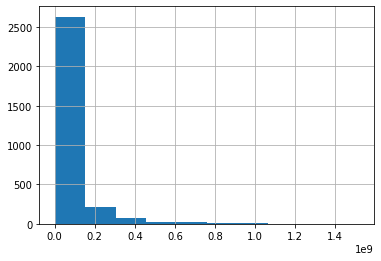

In [7]:
train.revenue.hist()

Skewed distribution

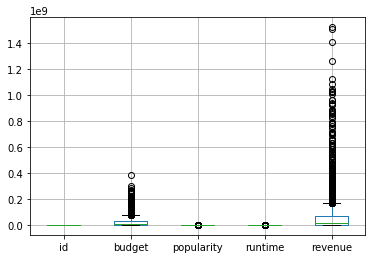

In [8]:
train.boxplot()

Many models assume normal distrubition of target
Try Log normal, many price models behave log normal

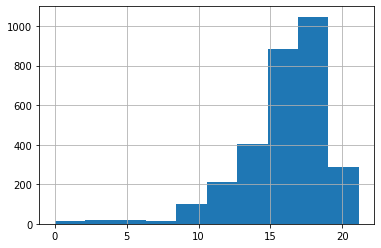

In [9]:
np.log(train.revenue).hist()

In [10]:
train.logrevenue = np.log(train.revenue)

In [11]:
stat, p = normaltest(train.logrevenue)
print('Statistics=%.3f, p=%.3f' % (stat, p))
#p>0.05 reject null, sample does not look Gaussian 

Statistics=1025.963, p=0.000


In [12]:
# Skew and kurt
print("Skewness: %f" % train.logrevenue.skew())
print("Kurtosis: %f" % train.logrevenue.kurt())

Skewness: -1.679377
Kurtosis: 4.371074


Still Skewed, transform with boxcox

3000
Statistics=25.685, p=0.000
Skewness: -0.027347
Kurtosis: -0.367022


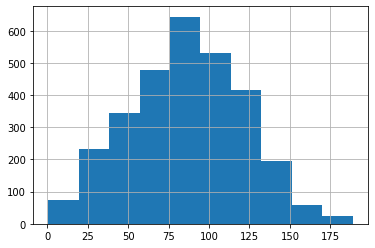

In [13]:
outlier = train[train.revenue < 2000000000]
print(outlier.revenue.count())
trainmodel = train
trainmodel['revenue'] = pd.DataFrame(boxcox1p(outlier['revenue'], boxcox_normmax(outlier['revenue'])))
trainmodel['revenue'].hist()
#print(test.head())
stat, p = normaltest(trainmodel['revenue'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
print("Skewness: %f" % trainmodel['revenue'].skew())
print("Kurtosis: %f" % trainmodel['revenue'].kurt())


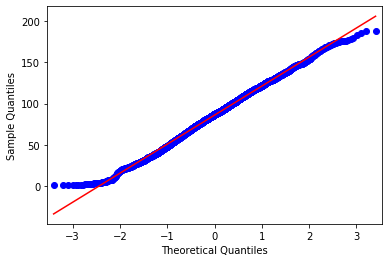

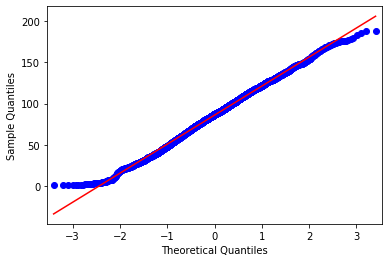

In [14]:
from statsmodels.graphics.gofplots import qqplot
qqplot(trainmodel['revenue'],line='s')

Good normal fit


 mu = 86.03 and sigma = 35.33



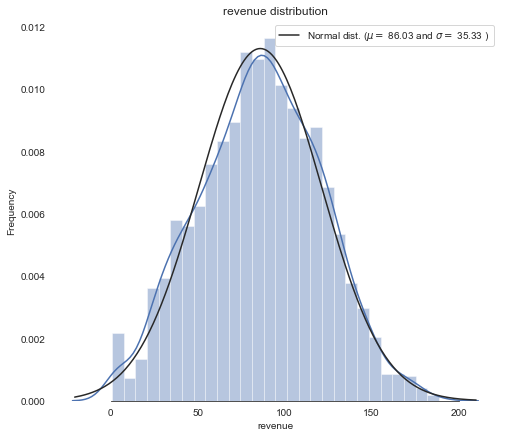

In [15]:
sns.set_style("white")
sns.set_color_codes(palette='deep')
f, ax = plt.subplots(figsize=(8, 7))
#Check the new distribution 
sns.distplot(trainmodel['revenue'] , fit=norm, color="b");

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(trainmodel['revenue'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
ax.xaxis.grid(False)
ax.set(ylabel="Frequency")
ax.set(xlabel="revenue")
ax.set(title="revenue distribution")
sns.despine(trim=True, left=True)

plt.show()

## Independent Variable exploration

### Independence test for numeric variables

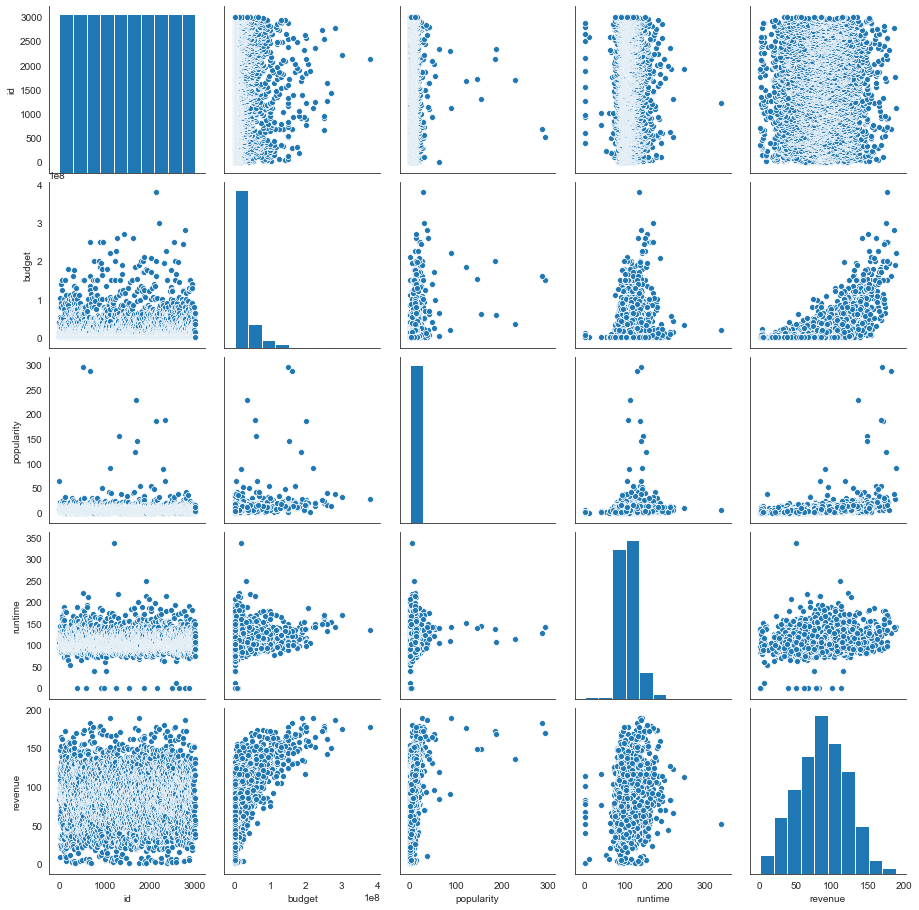

In [16]:
sns.pairplot(trainmodel)

['budget', 'popularity', 'runtime']


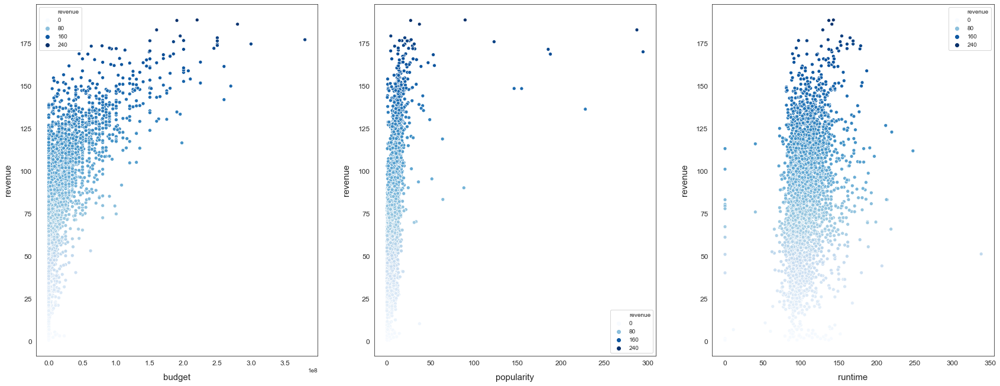

In [17]:
# Finding numeric features
numeric_dtypes = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
numeric = []
for i in trainmodel.columns:
    if trainmodel[i].dtype in numeric_dtypes:
        if i in ['id', 'revenue']:#,'Total_porch_sf','haspool','hasgarage','hasbsmt','hasfireplace']:
            pass
        else:
            numeric.append(i)  

print(numeric)
# visualising some more outliers in the data values
fig, axs = plt.subplots(ncols=3, nrows=0, figsize=(12, 15))
plt.subplots_adjust(right=2)
plt.subplots_adjust(top=2)
sns.color_palette("husl", 8)
for i, feature in enumerate(list(trainmodel[numeric]), 1):
    if(feature=='MiscVal'):
        break
    plt.subplot(len(list(numeric)), 3, i)
    sns.scatterplot(x=feature, y='revenue', hue='revenue', palette='Blues', data=trainmodel)
        
    plt.xlabel('{}'.format(feature), size=15,labelpad=12.5)
    plt.ylabel('revenue', size=15, labelpad=12.5)
    
    for j in range(2):
        plt.tick_params(axis='x', labelsize=12)
        plt.tick_params(axis='y', labelsize=12)
    
    plt.legend(loc='best', prop={'size': 10})
        
plt.show()

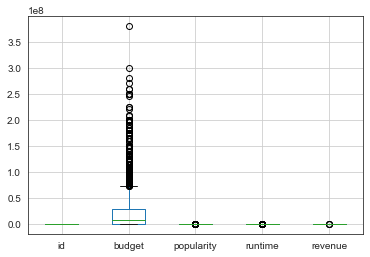

In [18]:
trainmodel.boxplot()

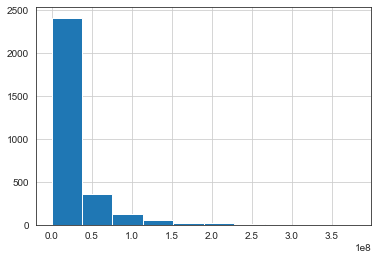

In [19]:
train['budget'].hist()


In [20]:
#train[train['budget']==0].count()
#trainmodel[train['budget']==0]['budget'] = np.nan
#trainmodel['budget'] = pd.DataFrame(boxcox1p(train['budget']+1, boxcox_normmax(train['budget']+1)))
#trainmodel[train['budget']==0]['budget'] = np.nan
trainmodel['budget'] = train['budget']
#trainmodel['budget'].replace(0,np.nan)
#trainmodel['budget'] = np.log(train['budget'])


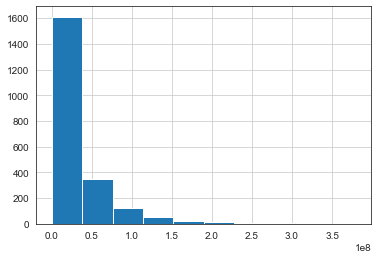

In [21]:
trainmodel[trainmodel['budget']>0.5]['budget'].hist()

# Categorical Variables

In [22]:
trainmodel.nunique()

id                       3000
belongs_to_collection     422
budget                    406
genres                    872
homepage                  941
imdb_id                  3000
original_language          36
original_title           2975
overview                 2992
popularity               2999
poster_path              2999
production_companies     2383
production_countries      321
release_date             2398
runtime                   139
spoken_languages          401
status                      2
tagline                  2400
title                    2969
Keywords                 2648
cast                     2975
crew                     2984
revenue                  2850
dtype: int64

### Explore Genres

In [23]:
trainmodel.genres.head()

0                       [{'id': 35, 'name': 'Comedy'}]
1    [{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...
2                        [{'id': 18, 'name': 'Drama'}]
3    [{'id': 53, 'name': 'Thriller'}, {'id': 18, 'n...
4    [{'id': 28, 'name': 'Action'}, {'id': 53, 'nam...
Name: genres, dtype: object

In [24]:
import ast
from pandas.io.json import json_normalize
import json

def list_of_dicts(ld):
    '''
    Create a mapping of the tuples formed after 
    converting json strings of list to a python list   
    '''
    #ast.literal_eval
    #list(d.values())[0]
    return dict([(list(d.values())[1], 1) for d in eval(ld)])
    #return dict([(list(d.values())[1], list(d.values())[0]) for d in eval(ld)])
    #return dict([(d.values()['name'], d.values()['id']) for d in eval(ld)])

genredf1 = trainmodel[~trainmodel.genres.isnull()]
#js = [{'id': 35, 'name': 'Comedy'},{'id': 18, 'name': 'Drama'}]
#st = "[{'id': 35, 'name': 'Comedy'},{'id': 18, 'name': 'Drama'}]"
#x = eval(st)

genredf2 = json_normalize(genredf1.genres.apply(list_of_dicts).to_list())
genres = genredf2.columns 

genredf1 = genredf1.join(json_normalize(genredf1.genres.apply(list_of_dicts).to_list()))





In [25]:
#feature = ['budget','original_language','popularity','runtime']
feature = ['budget','popularity','runtime']
feature.extend(genres)

In [26]:
genredf1.original_language = genredf1.original_language.astype('category')
pd.get_dummies(genredf1.original_language)
genredf1
for col in genres:
    genredf1[col].fillna(0, inplace = True)
genredf1.runtime.fillna(genredf1.runtime.mean(), inplace=True)

train_labels = genredf1['revenue'].reset_index(drop=True)
X = genredf1[feature]

### Language

In [27]:
print(genredf1['original_language'].value_counts())

en    2571
fr      78
ru      45
es      43
hi      42
ja      37
it      23
ko      20
cn      20
zh      19
de      18
ta      16
sv       8
pt       6
nl       6
fa       5
da       5
ro       4
hu       3
tr       3
ml       2
pl       2
fi       2
no       2
te       2
cs       1
el       1
ur       1
bn       1
he       1
id       1
sr       1
vi       1
mr       1
nb       1
ar       1
Name: original_language, dtype: int64


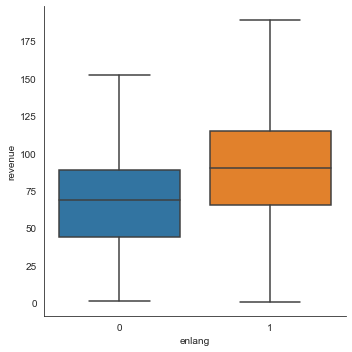

In [28]:
genredf1['enlang'] = np.where(genredf1['original_language'] == 'en', 1, 0)
sns.catplot(x = 'enlang', y = 'revenue', data = genredf1, kind = 'box')

In [29]:
feature.extend(['enlang'])
#enlang doesn't improve model much

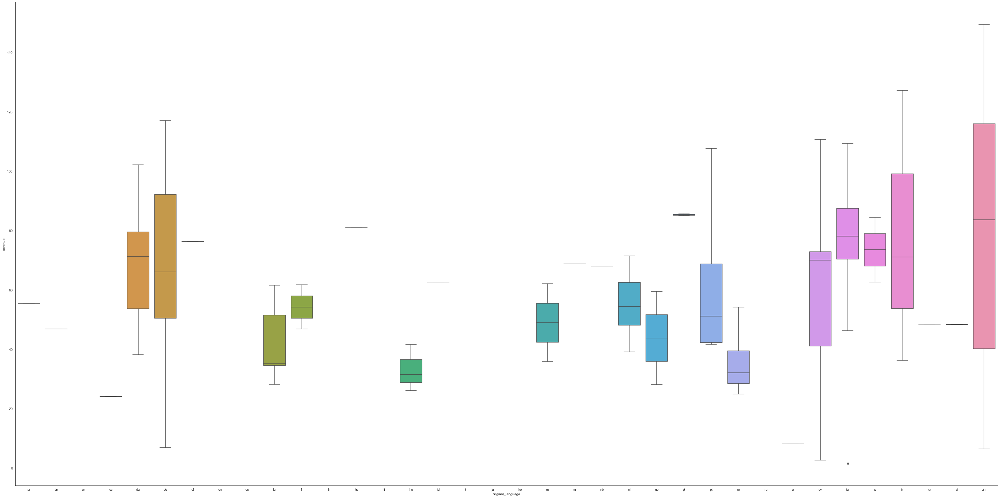

In [30]:
toplang_df = genredf1.groupby(['original_language']).filter(lambda x: x['original_language'].count()<20)
toplang_df.original_language.astype('category')

#genredf1[genredf1['original_language'].value_counts()>20]

chart = sns.catplot(x = 'original_language', y = 'revenue', data = toplang_df, kind = 'box', height = 20, aspect= 20/10)
#chart.set_xticklabels(rotation = 45)

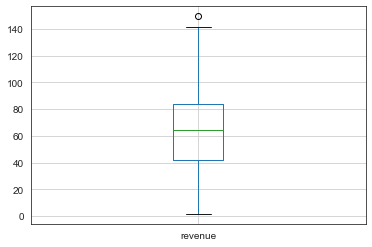

In [31]:
toplang_df[['original_language','revenue']].boxplot()

## Categorical Feature endcoding

In [32]:
print(pd.get_dummies(genredf1, columns = ['original_language'], prefix = ['lang']).head)

745        0  
1746        0  
1747        0  
1748        0  
1749        0  
1750        1  
1751        0  
1752        0  
1753        0  
1754        0  
1755        0  
1756        0  
1757        0  
1758        0  
1759        0  
1760        0  
1761        0  
1762        0  
1763        0  
1764        0  
1765        0  
1766        0  
1767        0  
1768        0  
1769        0  
1770        0  
1771        0  
1772        0  
1773        0  
1774        0  
1775        0  
1776        0  
1777        0  
1778        0  
1779        0  
1780        0  
1781        0  
1782        0  
1783        0  
1784        0  
1785        0  
1786        0  
1787        0  
1788        0  
1789        0  
1790        0  
1791        0  
1792        0  
1793        0  
1794        0  
1795        0  
1796        0  
1797        0  
1798        0  
1799        0  
1800        0  
1801        0  
1802        0  
1803        0  
1804        0  
1805        0  
1806        0  
1807     

## Missing Values

In [33]:
genredf1[feature].isna().sum()
#genredf1['Comedy'].fillna(0, inplace = True)
#genredf1[genredf1['Comedy'].isna()]
#df_na = genredf1[genredf1[genres].isna()][genres]

budget             0
popularity         0
runtime            0
Comedy             0
Drama              0
Family             0
Romance            0
Thriller           0
Action             0
Animation          0
Adventure          0
Horror             0
Documentary        0
Music              0
Crime              0
Science Fiction    0
Mystery            0
Foreign            0
Fantasy            0
War                0
Western            0
History            0
TV Movie           0
enlang             0
dtype: int64

In [34]:
# Setup cross validation folds
kf = KFold(n_splits=12, random_state=42, shuffle=True)

In [35]:
# Define error metrics
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X=X):
    rmse = np.sqrt(-cross_val_score(model, X, train_labels, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [36]:
# Light Gradient Boosting Regressor
lightgbm = LGBMRegressor(objective='regression', 
                       num_leaves=6,
                       learning_rate=0.01, 
                       n_estimators=7000,
                       max_bin=200, 
                       bagging_fraction=0.8,
                       bagging_freq=4, 
                       bagging_seed=8,
                       feature_fraction=0.2,
                       feature_fraction_seed=8,
                       min_sum_hessian_in_leaf = 11,
                       verbose=-1,
                       random_state=42)

# XGBoost Regressor
xgboost = XGBRegressor(learning_rate=0.01,
                       n_estimators=6000,
                       max_depth=4,
                       min_child_weight=0,
                       gamma=0.6,
                       subsample=0.7,
                       colsample_bytree=0.7,
                       objective='reg:linear',
                       nthread=-1,
                       scale_pos_weight=1,
                       seed=27,
                       reg_alpha=0.00006,
                       random_state=42)


rf = RandomForestRegressor(n_estimators=1200,
                          max_depth=15,
                          min_samples_split=10,
                          min_samples_leaf=10,
                          max_features=None,
                          oob_score=True,
                          random_state=42)

# Support Vector Regressor
svr = make_pipeline(RobustScaler(), SVR(C= 20, epsilon= 0.008, gamma=0.0003))

## Train Models

In [37]:
X = genredf1[feature]
scores = {}

score = cv_rmse(lightgbm)
print("lightgbm: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['lgb'] = (score.mean(), score.std())

lightgbm: 23.0922 (1.4015)


In [38]:
lgbm = lightgbm.fit(X=X,y=train_labels)
lgbm.feature_importances_

array([4571, 5697, 4996, 1348, 1390, 1047, 1137, 1216, 1280,  864, 1074,
        934,  605,  904, 1055, 1075,  890,  371, 1080,  795,  577,  764,
          0, 1314])

In [39]:
score = cv_rmse(xgboost)
print("xgboost: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['xgb'] = (score.mean(), score.std())

[11:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.0.0/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
[11:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.0.0/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
[11:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.0.0/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
[11:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.0.0/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
[11:30:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.0.0/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
[11:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.0.0/src/objective/regression_obj.cu:16

In [40]:
score = cv_rmse(svr)
print("SVR: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['svr'] = (score.mean(), score.std())

SVR: 27.1716 (1.8537)


In [41]:
score = cv_rmse(rf)
print("rf: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['rf'] = (score.mean(), score.std())

rf: 22.9495 (1.4185)


## Hyperparameter Tuning

In [42]:
parameters = {"kernel": ["rbf"], "C": [1,10,10,100,1000], "gamma": [1e-8, 1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2,1e-1]}
grid = GridSearchCV(SVR(), parameters, cv=5, verbose=2)
grid.fit(X, train_labels)

.... C=10, gamma=1e-05, kernel=rbf, total=   1.7s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=10, gamma=0.0001, kernel=rbf, total=   1.7s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=10, gamma=0.0001, kernel=rbf, total=   1.8s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=10, gamma=0.0001, kernel=rbf, total=   1.7s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=10, gamma=0.0001, kernel=rbf, total=   2.0s
[CV] C=10, gamma=0.0001, kernel=rbf ..................................
[CV] ................... C=10, gamma=0.0001, kernel=rbf, total=   1.6s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] .................... C=10, gamma=0.001, kernel=rbf, total=   2.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] .................... C

GridSearchCV(cv=5, error_score=nan,
             estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                           epsilon=0.1, gamma='scale', kernel='rbf',
                           max_iter=-1, shrinking=True, tol=0.001,
                           verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [1, 10, 10, 100, 1000],
                         'gamma': [1e-08, 1e-07, 1e-06, 1e-05, 0.0001, 0.001,
                                   0.01, 0.1],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=2)

In [43]:
print("Best parameters set found on development set:")
print()
print(grid.best_params_)
print()
print("Grid scores on development set:")
print()
means = grid.cv_results_['mean_test_score']
stds = grid.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, grid.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params))

Best parameters set found on development set:

{'C': 100, 'gamma': 1e-08, 'kernel': 'rbf'}

Grid scores on development set:

0.297 (+/-0.039) for {'C': 1, 'gamma': 1e-08, 'kernel': 'rbf'}
0.293 (+/-0.037) for {'C': 1, 'gamma': 1e-07, 'kernel': 'rbf'}
0.291 (+/-0.034) for {'C': 1, 'gamma': 1e-06, 'kernel': 'rbf'}
0.289 (+/-0.029) for {'C': 1, 'gamma': 1e-05, 'kernel': 'rbf'}
0.285 (+/-0.022) for {'C': 1, 'gamma': 0.0001, 'kernel': 'rbf'}
0.267 (+/-0.019) for {'C': 1, 'gamma': 0.001, 'kernel': 'rbf'}
0.216 (+/-0.023) for {'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
0.104 (+/-0.018) for {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'}
0.408 (+/-0.048) for {'C': 10, 'gamma': 1e-08, 'kernel': 'rbf'}
0.397 (+/-0.046) for {'C': 10, 'gamma': 1e-07, 'kernel': 'rbf'}
0.392 (+/-0.042) for {'C': 10, 'gamma': 1e-06, 'kernel': 'rbf'}
0.392 (+/-0.036) for {'C': 10, 'gamma': 1e-05, 'kernel': 'rbf'}
0.396 (+/-0.030) for {'C': 10, 'gamma': 0.0001, 'kernel': 'rbf'}
0.386 (+/-0.035) for {'C': 10, 'gamma': 0.001, 'kern

In [44]:
score

array([23.35377251, 20.90941201, 23.56089392, 22.97414553, 23.81241173,
       20.76843854, 24.08661529, 22.0709318 , 24.69249324, 25.31817769,
       22.67420522, 21.17287124])

In [45]:
scores

{'lgb': (23.09224102805821, 1.4015374043869686),
 'xgb': (23.726160508291514, 1.36998092380402),
 'svr': (27.171615999674923, 1.853749907678799),
 'rf': (22.949530727403047, 1.418544460302426)}